<a href="https://colab.research.google.com/github/RyanSmoak/FirstAIde/blob/main/skin_burn_yolo_detector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Connect to Google Drive

In [ ]:
#connect to google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Prepare the dataset

In [ ]:
import os
import shutil

In [ ]:
proj_folder = "/content/drive/MyDrive/Colab Notebooks/FirstAId"
orig_data_folder = f'{proj_folder}/skin_burn'

#find images that have corresponding .txt files
image_files = [
    f for f in os.listdir(orig_data_folder)
    if f.endswith('.jpg') and f[:-4] + '.txt' in os.listdir(orig_data_folder)
]
print(f'Found {len(image_files)} images')

label_files = [
    f for f in os.listdir(orig_data_folder)
    if f.endswith('.txt') and f[:-4] + '.jpg' in os.listdir(orig_data_folder)
]
print(f'Found {len(label_files)} labels')

Created clean_data folder
Found 1225 images
Found 1225 labels


In [ ]:
#define file paths for training and validation files
train_images_folder = f'{proj_folder}/skin_burn/images/train'
train_labels_folder = f'{proj_folder}/skin_burn/labels/train'

val_images_folder = f'{proj_folder}/skin_burn/images/val'
val_labels_folder = f'{proj_folder}/skin_burn/labels/val'

#create the training and validtion folders
for folder in [train_images_folder, train_labels_folder, val_images_folder, val_labels_folder]:
  if not os.path.exists(folder):
    os.makedirs(folder)

#sort and move files from index 981 to the end to the validation files
images_sorted = sorted(image_files, key=lambda x: os.path.basename(x))
labels_sorted = sorted(label_files, key=lambda x: os.path.basename(x))

for i in images_sorted[981:]:
  shutil.move(os.path.join(orig_data_folder, i), os.path.join(val_images_folder, i))
print(f"Moved {len(images_sorted[981:])} images to validation folder")

for i in labels_sorted[981:]:
  shutil.move(os.path.join(orig_data_folder, i), os.path.join(val_labels_folder, i))
print(f"Moved {len(labels_sorted[981:])} labels to validation folder")

Moved 244 images to validation folder
Moved 244 labels to validation folder


In [ ]:
#move remaining files to the training folders
for i in images_sorted[:981]:
  shutil.move(os.path.join(orig_data_folder, i), os.path.join(train_images_folder, i))
print(f"Moved {len(images_sorted[:981])} images to training folder")

for i in labels_sorted[:981]:
  shutil.move(os.path.join(orig_data_folder, i), os.path.join(train_labels_folder, i))
print(f"Moved {len(labels_sorted[:981])} labels to training folder")

Moved 981 images to training folder
Moved 981 labels to training folder


In [ ]:
#delete stranded files
for f in os.listdir(orig_data_folder):
  if f.endswith('.jpg') or f.endswith('.txt'):
    os.remove(os.path.join(orig_data_folder, f))

#Train YOLO on our dataset

In [ ]:
#make sure you're working on GPU
!nvidia-smi

Mon Jan 13 10:14:59 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.8/906.8 kB 25.0 MB/s eta 0:00:00


In [ ]:
#load the YOLOv11m model
from ultralytics import YOLO

model = YOLO('yolo11m.pt')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 38.8M/38.8M [00:00<00:00, 335MB/s]


In [ ]:
#create dataset config (.yaml) file
data_path = "/content/drive/MyDrive/Colab Notebooks/FirstAId/data.yaml"

if not os.path.isfile(data_path):
  with open(data_path, 'w') as f:
    f.write(f"""
    path: /content/drive/MyDrive/Colab Notebooks/FirstAId/skin_burn
    train: /content/drive/MyDrive/Colab Notebooks/FirstAId/skin_burn/images/train
    val: /content/drive/MyDrive/Colab Notebooks/FirstAId/skin_burn/images/val

    nc: 3
    names:
        0: first_degree
        1: second_degree
        2: third_degree
    """
    )
else:
  print(f"{data_path} already exists")

In [ ]:
#train the YOLO model
model.train(
    data = data_path,
    epochs = 100,
    time = 2,
    imgsz = 640,
    batch = 0.85,
    device = 0,
    optimizer = 'Adam',
    lr0 = 0.001,
    lrf = 0.01,
    momentum = 0.9,
    weight_decay = 0.0003,
    cos_lr = True,
    box = 8.5,
    cls = 1.0,
    dfl = 1.0,
    dropout = 0.5,
    plots = True,
    save = True
)

Ultralytics 8.3.59 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11m.pt, data=/content/drive/MyDrive/Colab Notebooks/FirstAId/data.yaml, epochs=100, time=2, patience=100, batch=0.85, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.5, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True,

100%|██████████| 755k/755k [00:00<00:00, 22.6MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           
  7                  -1  1   2360320  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 115MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/Colab Notebooks/FirstAId/skin_burn/labels/train... 981 images, 4 backgrounds, 0 corrupt: 100%|██████████| 981/981 [06:53<00:00,  2.37it/s]


train: New cache created: /content/drive/MyDrive/Colab Notebooks/FirstAId/skin_burn/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
AutoBatch: Computing optimal batch size for imgsz=640 at 85.0% CUDA memory utilization.
AutoBatch: CUDA:0 (Tesla T4) 14.75G total, 0.21G reserved, 0.19G allocated, 14.34G free
      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.0 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


    20055321        68.2         1.082         110.9           259        (1, 3, 640, 640)                    list
    20055321       136.4         1.701         56.98           104        (2, 3, 640, 640)                    list
    20055321       272.8         2.724          61.4         111.6        (4, 3, 640, 640)                    list
    20055321       545.6         4.758          93.2         133.2        (8, 3, 640, 640)                    list
    20055321        1091         8.892           180         209.4       (16, 3, 640, 640)                    list
AutoBatch: Using batch-size 26 for CUDA:0 12.43G/14.75G (84%) ✅


train: Scanning /content/drive/MyDrive/Colab Notebooks/FirstAId/skin_burn/labels/train.cache... 981 images, 4 backgrounds, 0 corrupt: 100%|██████████| 981/981 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Colab Notebooks/FirstAId/skin_burn/labels/val... 244 images, 0 backgrounds, 0 corrupt: 100%|██████████| 244/244 [03:12<00:00,  1.26it/s]


val: New cache created: /content/drive/MyDrive/Colab Notebooks/FirstAId/skin_burn/labels/val.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.00024375), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 2 hours...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      13.9G      2.608      7.003      1.597         62        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all        244        480    0.00823     0.0922    0.00462    0.00125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/141      13.8G      2.574      6.133      1.524         69        640: 100%|██████████| 38/38 [00:35<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.29s/it]

                   all        244        480    0.00141      0.182   0.000869   0.000238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/152      13.9G      2.582      6.144      1.523         66        640: 100%|██████████| 38/38 [00:35<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        244        480     0.0016      0.231    0.00103   0.000274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/160      13.9G      2.571      6.007      1.464         74        640: 100%|██████████| 38/38 [00:36<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all        244        480     0.0107      0.134    0.00467    0.00128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/162      13.9G       2.55      5.907      1.474         64        640: 100%|██████████| 38/38 [00:36<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all        244        480     0.0193      0.089     0.0113    0.00344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/163      13.9G      2.526      5.766      1.434         57        640: 100%|██████████| 38/38 [00:36<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.44it/s]

                   all        244        480      0.367      0.117     0.0167    0.00385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/165      13.9G      2.472      5.716      1.403         66        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.20it/s]

                   all        244        480      0.115      0.193     0.0602     0.0175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/165      13.9G      2.488      5.662      1.421         68        640: 100%|██████████| 38/38 [00:36<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all        244        480      0.132      0.133     0.0502     0.0161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/165      13.9G      2.437      5.522      1.396         57        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.44it/s]

                   all        244        480     0.0772      0.294     0.0691     0.0244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/166      13.9G      2.453      5.594       1.41         60        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.17it/s]

                   all        244        480      0.358      0.115     0.0752     0.0268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/166      13.9G      2.407      5.455      1.384         71        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all        244        480      0.138      0.172     0.0574     0.0218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/166      13.9G      2.403      5.371      1.365         78        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480      0.175      0.111     0.0554     0.0171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/166      13.9G      2.376      5.337      1.376         67        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.17it/s]

                   all        244        480      0.249      0.179      0.125     0.0412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/166      13.9G      2.378      5.341      1.362         65        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.29it/s]

                   all        244        480      0.181      0.162     0.0851      0.024



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/166      13.9G      2.388       5.31      1.363         50        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        244        480      0.439      0.101     0.0605     0.0195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/167      13.9G      2.352      5.345      1.362         85        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all        244        480      0.224      0.141     0.0841     0.0277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/166      13.9G      2.359      5.274      1.361         67        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.44it/s]

                   all        244        480      0.344       0.11     0.0849     0.0274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/167      13.9G      2.344      5.138      1.329         73        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.37it/s]

                   all        244        480      0.253      0.217     0.0976     0.0284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/167      13.9G      2.313      5.075      1.337         69        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.13it/s]

                   all        244        480      0.237      0.176      0.111     0.0342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/167      13.9G      2.336      5.113      1.343         69        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        244        480      0.156      0.273      0.113     0.0423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/167      13.9G      2.303      5.096      1.332         54        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.25it/s]

                   all        244        480      0.247      0.211      0.143     0.0499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/167      13.9G      2.309      5.059      1.332         62        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.11it/s]

                   all        244        480      0.206      0.249      0.144     0.0478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/167      13.9G      2.331      5.074      1.352         59        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.45it/s]

                   all        244        480      0.145      0.186     0.0963     0.0288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/167      13.9G      2.294      4.972      1.323         74        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all        244        480      0.268      0.212      0.168     0.0567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/167      13.9G      2.313      4.906      1.329         63        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480      0.256      0.196      0.121      0.038



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/167      13.9G      2.288      4.979      1.326         62        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.44it/s]

                   all        244        480      0.172      0.183      0.101     0.0319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/167      13.9G      2.246      4.952      1.311         55        640: 100%|██████████| 38/38 [00:37<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all        244        480      0.187      0.216      0.127     0.0426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/167      13.9G      2.254      4.831      1.317         59        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        244        480      0.239      0.229      0.134     0.0434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/167      13.9G      2.272      4.767      1.309         77        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.28it/s]

                   all        244        480      0.219      0.208      0.124     0.0417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/167      13.9G      2.269      4.789      1.312         79        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.13it/s]

                   all        244        480      0.331      0.187      0.121     0.0402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/167      13.9G      2.275      4.835      1.317         63        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        244        480       0.23      0.253      0.149     0.0458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/167      13.9G      2.254      4.745      1.304         78        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all        244        480      0.277      0.216      0.167     0.0555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/167      13.9G      2.257       4.76      1.302         60        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.42it/s]

                   all        244        480      0.237      0.217      0.147     0.0511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/167      13.9G      2.213      4.731      1.293         59        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.43it/s]

                   all        244        480      0.323       0.22      0.177     0.0613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/167      13.9G      2.232      4.744      1.293         78        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all        244        480      0.245      0.157     0.0911     0.0291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/167      13.9G      2.239      4.818      1.295         68        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480       0.25      0.207      0.133     0.0446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/167      13.9G      2.236       4.72      1.291         68        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.32it/s]

                   all        244        480      0.284      0.212      0.168       0.06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/167      13.9G      2.219      4.631      1.276         55        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.11it/s]

                   all        244        480      0.308      0.222      0.185     0.0609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/167      13.9G      2.222      4.583      1.281         68        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.45it/s]

                   all        244        480      0.179      0.243      0.122     0.0353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/167      13.9G      2.194      4.547      1.284         71        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all        244        480      0.245       0.24      0.161      0.056



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/167      13.9G      2.227      4.644      1.301         71        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.37it/s]

                   all        244        480      0.287      0.276      0.173     0.0537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/167      13.9G      2.221       4.61      1.294         63        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        244        480      0.254      0.226      0.163     0.0539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/167      13.9G      2.202      4.498      1.262         58        640: 100%|██████████| 38/38 [00:37<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all        244        480      0.278      0.247       0.18     0.0619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/167        14G      2.181      4.503      1.271         61        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        244        480       0.31      0.213      0.158      0.051



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/167      13.9G      2.207      4.487      1.288         68        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480      0.302       0.22      0.161     0.0533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/167      13.9G      2.171      4.428      1.286         54        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.08it/s]

                   all        244        480      0.338      0.228      0.184     0.0598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/167      13.9G      2.152      4.469      1.265         51        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.45it/s]

                   all        244        480      0.346      0.255      0.197     0.0692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/167      13.9G      2.154      4.396      1.268         58        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all        244        480      0.322      0.265      0.212     0.0751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/167      13.9G      2.169      4.379      1.261         68        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.45it/s]

                   all        244        480       0.23       0.26      0.161     0.0532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/167      13.9G      2.144      4.369      1.255         59        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.45it/s]

                   all        244        480      0.306       0.24      0.172     0.0593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/167      13.9G       2.15      4.347      1.254         52        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all        244        480      0.333       0.23      0.188     0.0673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/167      13.9G      2.139      4.382      1.261         56        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480      0.232      0.219      0.161     0.0515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/167      13.9G      2.144      4.275      1.251         75        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.30it/s]

                   all        244        480      0.283      0.241      0.171     0.0587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/167      13.9G      2.159      4.309      1.254         66        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.28it/s]

                   all        244        480       0.31      0.215      0.167     0.0575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/167      13.9G      2.108       4.22      1.245         55        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        244        480      0.332      0.245      0.199     0.0742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/167      13.9G      2.105      4.287      1.249         56        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.05s/it]

                   all        244        480      0.307      0.269      0.196     0.0711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/167      13.9G      2.175      4.286      1.269         68        640: 100%|██████████| 38/38 [00:37<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        244        480      0.287      0.234      0.181      0.064



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/167      13.9G      2.137      4.218      1.244         69        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.32it/s]

                   all        244        480      0.304      0.259      0.199      0.062



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/167      13.9G      2.121      4.266      1.265         69        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.08it/s]

                   all        244        480      0.316      0.315      0.209      0.068



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/167      13.9G      2.069      4.091      1.225         67        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        244        480      0.338      0.241      0.211     0.0716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/167      13.9G        2.1      4.069      1.242         57        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.22it/s]

                   all        244        480      0.338      0.248      0.204     0.0765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/167      13.9G      2.096      4.122      1.234         67        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.41it/s]

                   all        244        480      0.307      0.247      0.198     0.0722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/167      13.9G      2.107       4.06      1.236         80        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        244        480      0.335      0.239      0.198     0.0688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/167      13.9G      2.066      4.008      1.225         66        640: 100%|██████████| 38/38 [00:37<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all        244        480      0.336      0.279      0.214     0.0688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/167      13.9G       2.08      3.973      1.232         70        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480      0.338       0.23      0.205     0.0649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/167      13.9G       2.06      4.021      1.221         68        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.33it/s]

                   all        244        480      0.309      0.241      0.196     0.0655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/167      13.9G      2.066      3.986      1.223         74        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.13it/s]

                   all        244        480      0.289      0.264      0.196     0.0675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/167      13.9G      2.041      3.857      1.207         67        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        244        480      0.363       0.27      0.208     0.0725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/167      13.9G       2.04      3.915      1.224         67        640: 100%|██████████| 38/38 [00:37<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all        244        480      0.389      0.243      0.228     0.0785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/167      13.9G      2.046      3.806      1.222         61        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        244        480      0.285      0.262      0.197     0.0746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/167      13.9G      2.022      3.813      1.203         71        640: 100%|██████████| 38/38 [00:37<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.35it/s]

                   all        244        480      0.298       0.23      0.167     0.0524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/167      13.9G      1.991       3.72      1.204         63        640: 100%|██████████| 38/38 [00:37<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.13it/s]

                   all        244        480      0.381      0.251       0.22     0.0764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/167      13.9G      1.987      3.703      1.175         77        640: 100%|██████████| 38/38 [00:38<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480      0.373      0.249       0.22     0.0786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/167      13.9G      2.001      3.687      1.199         47        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.18it/s]

                   all        244        480      0.413      0.243      0.225     0.0772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/167      13.9G      2.027      3.666      1.198         61        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.29it/s]

                   all        244        480       0.34      0.256      0.222     0.0702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/167      13.9G      2.012      3.682      1.202         50        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        244        480      0.297      0.243      0.194     0.0641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/167      13.9G      1.976       3.65      1.188         71        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all        244        480      0.282      0.255        0.2     0.0695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/167      13.9G      1.977      3.625      1.185         65        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        244        480      0.416      0.228      0.207     0.0747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/167      13.9G      1.994      3.602      1.184         77        640: 100%|██████████| 38/38 [00:37<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.42it/s]

                   all        244        480      0.309      0.268      0.197     0.0666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/167      13.9G          2      3.686      1.204         51        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all        244        480      0.442       0.24      0.223     0.0762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/167      13.9G      1.957      3.574      1.184         67        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        244        480      0.306      0.244      0.191     0.0655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/167      13.9G      1.957      3.538      1.196         73        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.17it/s]

                   all        244        480      0.371      0.239      0.191     0.0687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/167      13.9G      1.936      3.506      1.178         71        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.17it/s]

                   all        244        480      0.316      0.308      0.227     0.0779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/167      13.9G       1.93      3.503      1.168         77        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480      0.309      0.247      0.187     0.0621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/167      13.9G      1.912      3.492      1.164         64        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.18it/s]

                   all        244        480       0.37      0.229      0.198     0.0719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/167      13.9G      1.925       3.47      1.163         53        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.43it/s]

                   all        244        480      0.347      0.232      0.181     0.0619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/167      13.9G      1.888       3.38      1.154         97        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        244        480      0.291      0.249      0.191     0.0681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/167      13.9G      1.885      3.262      1.143         68        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all        244        480      0.405      0.234      0.193     0.0652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/167      13.9G      1.874      3.307      1.141         65        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.45it/s]

                   all        244        480      0.353      0.271      0.222     0.0812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/167      13.9G      1.882      3.289      1.157         83        640: 100%|██████████| 38/38 [00:37<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        244        480      0.387      0.253      0.209     0.0744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/167      13.9G      1.865      3.303      1.147         64        640: 100%|██████████| 38/38 [00:38<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all        244        480      0.367      0.264      0.229     0.0799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/167      13.9G      1.898      3.317      1.166         76        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480      0.379      0.232      0.187     0.0611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/167      13.9G      1.894      3.261      1.148         75        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.34it/s]

                   all        244        480      0.451      0.238      0.232     0.0738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/167      13.9G      1.848      3.216      1.141         54        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.19it/s]

                   all        244        480      0.399      0.229      0.206     0.0714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/167        14G      1.826      3.147      1.126         57        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.45it/s]

                   all        244        480      0.348      0.251      0.187     0.0675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/167      13.9G      1.839      3.095       1.13         82        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.16it/s]

                   all        244        480      0.309      0.282      0.216     0.0716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/167      13.9G      1.824      3.135      1.128         71        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.32it/s]

                   all        244        480        0.5      0.223      0.221     0.0767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/167      13.9G       1.81      3.079      1.124         51        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480      0.363      0.268      0.208     0.0744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/167      13.9G      1.781      3.036       1.11         67        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]

                   all        244        480      0.314      0.282      0.206     0.0682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/167      13.9G      1.799      3.024      1.115         52        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        244        480      0.321      0.237      0.179     0.0643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/167      13.9G      1.769      2.924      1.105         88        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.26it/s]

                   all        244        480      0.357      0.268      0.209     0.0692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/167      13.9G      1.783      3.013      1.108         69        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.19it/s]

                   all        244        480      0.362      0.271      0.215     0.0741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/167      13.9G      1.758      2.907      1.096         70        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        244        480       0.37      0.241      0.204     0.0726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/167      13.9G      1.782      2.888      1.099         73        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.12it/s]

                   all        244        480      0.376      0.262      0.227     0.0786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/167      13.9G      1.773      2.932        1.1         46        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.25it/s]

                   all        244        480      0.309      0.245      0.206     0.0671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/167      13.9G      1.755      2.893      1.098         65        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        244        480      0.341      0.237      0.204     0.0722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/167      13.9G      1.732      2.833      1.082         63        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.18it/s]

                   all        244        480      0.396      0.227      0.216     0.0738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/167      13.9G      1.734      2.784      1.088         71        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        244        480      0.381      0.251       0.22     0.0745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/167      13.9G      1.717      2.817      1.084         70        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        244        480      0.397      0.257      0.225     0.0784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/167      13.9G      1.687       2.75      1.076         55        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all        244        480      0.383      0.259      0.203     0.0778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/167      13.9G      1.693      2.676      1.072         61        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        244        480      0.347      0.269      0.229     0.0794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/167      13.9G      1.703      2.753      1.069         73        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.38it/s]

                   all        244        480      0.382      0.229      0.206     0.0724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/167      13.9G      1.663      2.737       1.06         65        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.19it/s]

                   all        244        480       0.48      0.225      0.215     0.0716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/167      13.9G       1.66      2.649       1.06         77        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        244        480      0.354      0.244      0.202     0.0727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/167      13.9G      1.644      2.622      1.048         52        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.23it/s]

                   all        244        480      0.392      0.248      0.219     0.0793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/167      13.9G      1.645      2.583      1.052         87        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.26it/s]

                   all        244        480      0.457      0.233      0.213     0.0775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/167      13.9G      1.654      2.626      1.049         59        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.51it/s]

                   all        244        480       0.35      0.256      0.212     0.0776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/168      13.9G       1.62      2.512      1.041         76        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.23it/s]

                   all        244        480      0.322      0.284      0.221     0.0856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/168      13.9G      1.627      2.522      1.042         57        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.42it/s]

                   all        244        480      0.426      0.248      0.221     0.0746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/168      13.9G      1.602      2.558      1.035         74        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.51it/s]

                   all        244        480      0.384      0.278      0.227     0.0789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/168      13.9G      1.548      2.428      1.009         51        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.08it/s]

                   all        244        480      0.356      0.245      0.202     0.0705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/168      13.9G      1.573      2.444      1.025         69        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480      0.372      0.242      0.216     0.0747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/168      13.9G      1.595      2.452      1.034         67        640: 100%|██████████| 38/38 [00:38<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        244        480      0.341      0.287       0.21     0.0728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/168      13.9G       1.57      2.428       1.02         62        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all        244        480      0.386      0.258      0.216     0.0748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/168      13.9G       1.56      2.399       1.01         63        640: 100%|██████████| 38/38 [00:38<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        244        480      0.349      0.265      0.206     0.0746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/168      13.9G      1.534      2.401       1.01         67        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.37it/s]

                   all        244        480      0.315      0.252      0.198     0.0737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/168      13.9G      1.538      2.328       1.01         67        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.12it/s]

                   all        244        480       0.43      0.215      0.201     0.0719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/168      13.9G      1.501      2.271     0.9822         73        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        244        480       0.34      0.275      0.217     0.0755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/168      13.9G      1.519      2.315     0.9978         67        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.30it/s]

                   all        244        480      0.356      0.272      0.202     0.0723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/168      13.9G      1.534      2.305     0.9984         54        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.22it/s]

                   all        244        480      0.324      0.266      0.208      0.074



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/168      13.9G      1.496      2.231     0.9748         58        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.52it/s]

                   all        244        480      0.354      0.281      0.222     0.0803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/168      13.9G      1.478      2.218     0.9737         63        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.25it/s]

                   all        244        480      0.403       0.25      0.227     0.0829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/168      13.9G      1.483       2.19      0.978         57        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.29it/s]

                   all        244        480      0.415      0.243      0.223     0.0791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/168      13.9G      1.469      2.194     0.9707         81        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        244        480      0.324      0.276       0.21      0.075



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/168      13.9G      1.465      2.184     0.9684         73        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.10it/s]

                   all        244        480      0.342      0.261      0.216     0.0814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/168      13.9G      1.455      2.139     0.9667         49        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480      0.368      0.232      0.204     0.0769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/168      13.9G      1.463      2.153     0.9704         64        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        244        480      0.366      0.243      0.202     0.0751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/168      13.9G      1.452       2.18     0.9665         73        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all        244        480      0.416      0.215      0.201     0.0763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/168      13.9G       1.46      2.171     0.9677         77        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        244        480       0.41      0.239      0.212     0.0764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/168      13.9G      1.413      2.099     0.9431         63        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480      0.386      0.242      0.209     0.0787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/168      13.9G      1.418      2.056     0.9438         59        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all        244        480      0.365      0.274      0.224     0.0867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/168      13.9G       1.43      2.083     0.9566         61        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        244        480      0.406      0.238      0.217     0.0801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/168      13.9G       1.39      2.036      0.941         73        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.33it/s]

                   all        244        480        0.3      0.282      0.216     0.0782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/168      13.9G       1.43      2.094     0.9583         53        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.19it/s]

                   all        244        480      0.326      0.257      0.209     0.0753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/168      13.9G      1.389      2.004     0.9363         50        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.51it/s]

                   all        244        480      0.355       0.23      0.199     0.0723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/168      13.9G      1.405      2.029     0.9416         63        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.11it/s]

                   all        244        480      0.361      0.256      0.218     0.0769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/168      13.9G      1.395      2.061      0.939         68        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        244        480      0.361      0.252      0.209     0.0755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/168      13.9G      1.351      1.977     0.9247         61        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        244        480      0.339      0.263       0.21     0.0758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/168      13.9G      1.396      2.026     0.9402         68        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.08it/s]

                   all        244        480      0.397      0.234       0.21     0.0726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/168      13.9G      1.369      2.042     0.9356         71        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.51it/s]

                   all        244        480      0.342      0.253      0.207     0.0735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/168      13.9G      1.356      1.982       0.92         63        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.32it/s]

                   all        244        480      0.402      0.244      0.215     0.0749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/168      13.9G      1.373      2.002     0.9303         63        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.17it/s]

                   all        244        480      0.407      0.245      0.207     0.0753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/168      13.9G      1.358      1.949     0.9288         86        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        244        480      0.356      0.279      0.215     0.0795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/168      13.9G      1.394       2.03     0.9393         71        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.18it/s]

                   all        244        480      0.378      0.257      0.216     0.0795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/168      13.9G      1.343      1.905     0.9229         59        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.35it/s]

                   all        244        480      0.397      0.246      0.216     0.0781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/168      13.9G      1.359      1.968     0.9335         68        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        244        480      0.357      0.264      0.217     0.0783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/168      13.9G       1.35      1.965     0.9163         69        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.13it/s]

                   all        244        480        0.4      0.247      0.216     0.0785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/168      13.9G      1.351      1.902     0.9166         65        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        244        480      0.373       0.25      0.215     0.0753


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/168      13.9G      1.455      2.009     0.9867         37        640: 100%|██████████| 38/38 [00:38<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        244        480      0.363      0.256      0.211     0.0763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/168      13.9G      1.382      1.784     0.9641         38        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all        244        480      0.352      0.259      0.205     0.0761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/168      13.9G       1.34      1.696     0.9463         31        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        244        480       0.37      0.247      0.202     0.0743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/168      13.9G      1.313      1.693     0.9351         32        640: 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        244        480       0.37      0.257      0.208     0.0761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/168      13.9G      1.313      1.648     0.9369         31        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.22it/s]

                   all        244        480      0.397      0.236      0.207     0.0767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/168      13.9G      1.309      1.653     0.9305         33        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.13it/s]

                   all        244        480      0.342      0.263      0.204     0.0761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/168      13.9G       1.29      1.637     0.9264         31        640: 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        244        480      0.354       0.26       0.21     0.0778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/168      13.9G      1.275      1.621     0.9211         29        640: 100%|██████████| 38/38 [00:37<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        244        480      0.363      0.256      0.209     0.0765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/168      13.9G      1.297      1.659     0.9308         31        640: 100%|██████████| 38/38 [00:37<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.21it/s]

                   all        244        480      0.381      0.238      0.208     0.0773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/168      13.9G      1.268      1.659      0.916         71        640:  63%|██████▎   | 24/38 [00:24<00:14,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        244        480      0.386       0.24      0.206     0.0765



168 epochs completed in 2.002 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 40.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 40.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.59 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11m summary (fused): 303 layers, 20,032,345 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.26s/it]


                   all        244        480      0.361      0.273      0.224     0.0862
          first_degree         95        161      0.173       0.18      0.102     0.0345
         second_degree        116        243      0.359      0.284      0.226     0.0742
          third_degree         51         76      0.551      0.355      0.344       0.15
Speed: 0.3ms preprocess, 10.4ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c31540ba620>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

In [ ]:
# Validate the model
metrics = model.val()
print(metrics.box.map)  # mAP50-95

Ultralytics 8.3.59 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11m summary (fused): 303 layers, 20,032,345 parameters, 0 gradients, 67.7 GFLOPs


val: Scanning /content/drive/MyDrive/Colab Notebooks/FirstAId/skin_burn/labels/val.cache... 244 images, 0 backgrounds, 0 corrupt: 100%|██████████| 244/244 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:09<00:00,  1.04it/s]


                   all        244        480      0.354      0.262      0.213     0.0834
          first_degree         95        161      0.168      0.168     0.0965     0.0346
         second_degree        116        243      0.377      0.288      0.225     0.0734
          third_degree         51         76      0.517      0.329      0.317      0.142
Speed: 0.4ms preprocess, 23.1ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/train2
0.08341447093408877


#Test the model


image 1/12 /content/drive/MyDrive/Colab Notebooks/FirstAId/test_images/burn_test10_third.jpg: 384x640 2 third_degrees, 25.2ms
image 2/12 /content/drive/MyDrive/Colab Notebooks/FirstAId/test_images/burn_test11_third.jpg: 384x640 1 third_degree, 24.1ms
image 3/12 /content/drive/MyDrive/Colab Notebooks/FirstAId/test_images/burn_test12_first.jpg: 448x640 1 first_degree, 29.4ms
image 4/12 /content/drive/MyDrive/Colab Notebooks/FirstAId/test_images/burn_test1_first.jpg: 416x640 2 second_degrees, 28.7ms
image 5/12 /content/drive/MyDrive/Colab Notebooks/FirstAId/test_images/burn_test2_first.jpg: 416x640 1 second_degree, 28.0ms
image 6/12 /content/drive/MyDrive/Colab Notebooks/FirstAId/test_images/burn_test3_second.jpg: 480x640 (no detections), 30.2ms
image 7/12 /content/drive/MyDrive/Colab Notebooks/FirstAId/test_images/burn_test4_third.jpg: 448x640 1 third_degree, 29.2ms
image 8/12 /content/drive/MyDrive/Colab Notebooks/FirstAId/test_images/burn_test5_first.jpg: 320x640 1 second_degree, 24.0

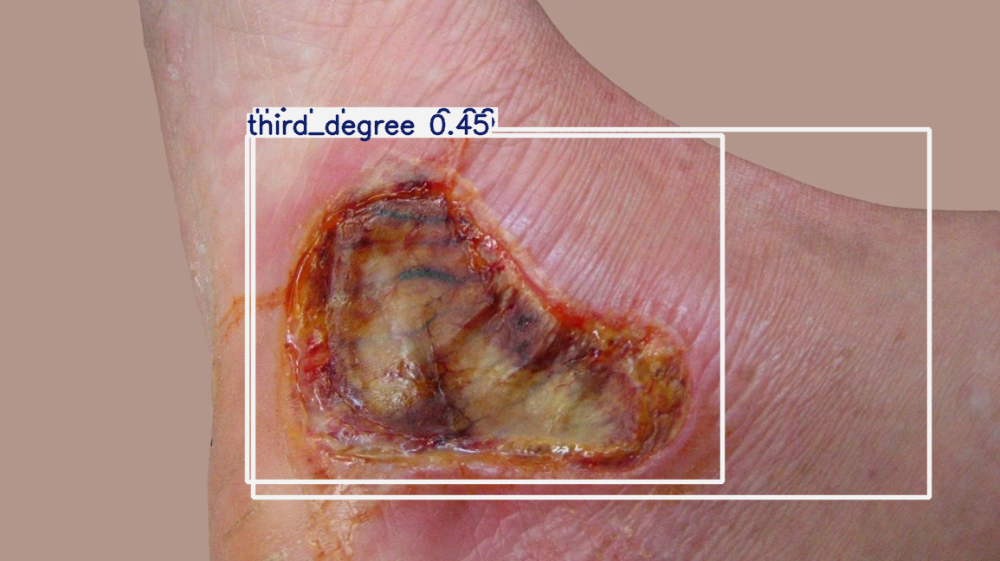

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2.], device='cuda:0')
conf: tensor([0.4591], device='cuda:0')
data: tensor([[3.8974e+02, 3.1196e+02, 6.1347e+02, 5.2815e+02, 4.5908e-01, 2.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (648, 1155)
shape: torch.Size([1, 6])
xywh: tensor([[501.6063, 420.0561, 223.7364, 216.1862]], device='cuda:0')
xywhn: tensor([[0.4343, 0.6482, 0.1937, 0.3336]], device='cuda:0')
xyxy: tensor([[389.7381, 311.9630, 613.4745, 528.1492]], device='cuda:0')
xyxyn: tensor([[0.3374, 0.4814, 0.5311, 0.8150]], device='cuda:0')
None


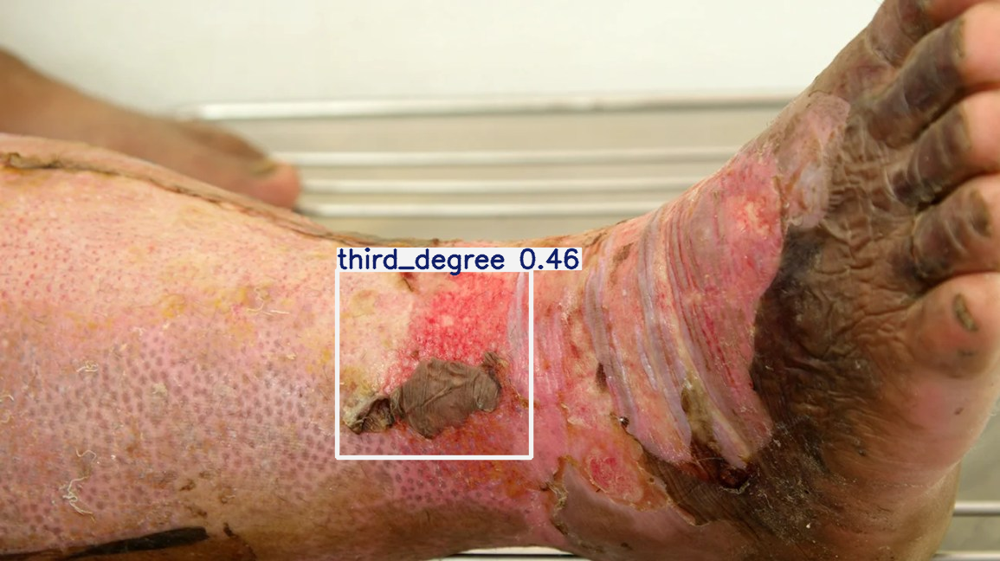

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.], device='cuda:0')
conf: tensor([0.8825], device='cuda:0')
data: tensor([[180.1701, 130.7933, 511.7735, 361.0182,   0.8825,   0.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (440, 660)
shape: torch.Size([1, 6])
xywh: tensor([[345.9718, 245.9058, 331.6034, 230.2249]], device='cuda:0')
xywhn: tensor([[0.5242, 0.5589, 0.5024, 0.5232]], device='cuda:0')
xyxy: tensor([[180.1701, 130.7933, 511.7735, 361.0182]], device='cuda:0')
xyxyn: tensor([[0.2730, 0.2973, 0.7754, 0.8205]], device='cuda:0')
None


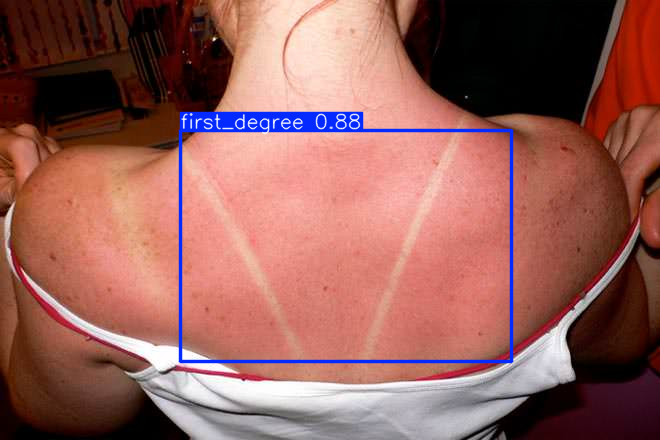

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1., 1.], device='cuda:0')
conf: tensor([0.8180, 0.7303], device='cuda:0')
data: tensor([[447.8354, 159.9671, 706.8140, 337.6205,   0.8180,   1.0000],
        [366.8123, 384.5437, 495.4858, 473.4461,   0.7303,   1.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (553, 860)
shape: torch.Size([2, 6])
xywh: tensor([[577.3246, 248.7938, 258.9786, 177.6534],
        [431.1490, 428.9949, 128.6735,  88.9024]], device='cuda:0')
xywhn: tensor([[0.6713, 0.4499, 0.3011, 0.3213],
        [0.5013, 0.7758, 0.1496, 0.1608]], device='cuda:0')
xyxy: tensor([[447.8354, 159.9671, 706.8140, 337.6205],
        [366.8123, 384.5437, 495.4858, 473.4461]], device='cuda:0')
xyxyn: tensor([[0.5207, 0.2893, 0.8219, 0.6105],
        [0.4265, 0.6954, 0.5761, 0.8561]], device='cuda:0')
None


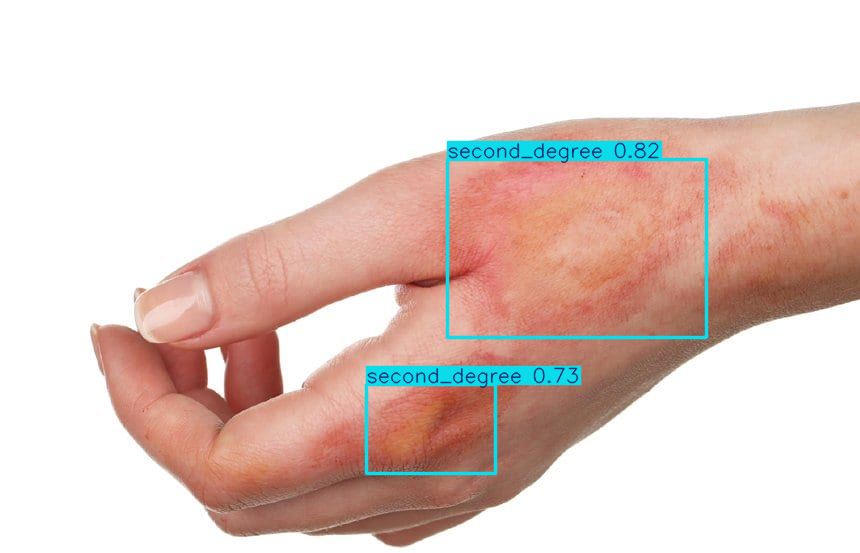

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1.], device='cuda:0')
conf: tensor([0.3727], device='cuda:0')
data: tensor([[ 45.9738,  63.6220, 182.9488, 118.3626,   0.3727,   1.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (186, 300)
shape: torch.Size([1, 6])
xywh: tensor([[114.4613,  90.9923, 136.9749,  54.7406]], device='cuda:0')
xywhn: tensor([[0.3815, 0.4892, 0.4566, 0.2943]], device='cuda:0')
xyxy: tensor([[ 45.9738,  63.6220, 182.9488, 118.3626]], device='cuda:0')
xyxyn: tensor([[0.1532, 0.3421, 0.6098, 0.6364]], device='cuda:0')
None


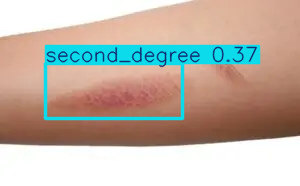

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([], device='cuda:0')
conf: tensor([], device='cuda:0')
data: tensor([], device='cuda:0', size=(0, 6))
id: None
is_track: False
orig_shape: (225, 300)
shape: torch.Size([0, 6])
xywh: tensor([], device='cuda:0', size=(0, 4))
xywhn: tensor([], device='cuda:0', size=(0, 4))
xyxy: tensor([], device='cuda:0', size=(0, 4))
xyxyn: tensor([], device='cuda:0', size=(0, 4))
None


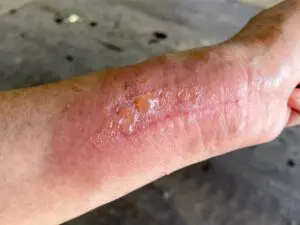

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2.], device='cuda:0')
conf: tensor([0.7201], device='cuda:0')
data: tensor([[110.7993,  62.2348, 220.1346, 152.8633,   0.7201,   2.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (201, 300)
shape: torch.Size([1, 6])
xywh: tensor([[165.4669, 107.5491, 109.3353,  90.6284]], device='cuda:0')
xywhn: tensor([[0.5516, 0.5351, 0.3645, 0.4509]], device='cuda:0')
xyxy: tensor([[110.7993,  62.2348, 220.1346, 152.8633]], device='cuda:0')
xyxyn: tensor([[0.3693, 0.3096, 0.7338, 0.7605]], device='cuda:0')
None


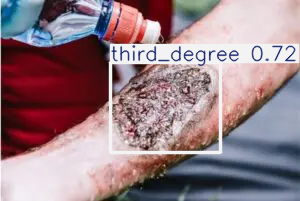

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1.], device='cuda:0')
conf: tensor([0.3805], device='cuda:0')
data: tensor([[186.6214,  59.4737, 258.3209, 134.1351,   0.3805,   1.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (180, 360)
shape: torch.Size([1, 6])
xywh: tensor([[222.4712,  96.8044,  71.6995,  74.6614]], device='cuda:0')
xywhn: tensor([[0.6180, 0.5378, 0.1992, 0.4148]], device='cuda:0')
xyxy: tensor([[186.6214,  59.4737, 258.3209, 134.1351]], device='cuda:0')
xyxyn: tensor([[0.5184, 0.3304, 0.7176, 0.7452]], device='cuda:0')
None


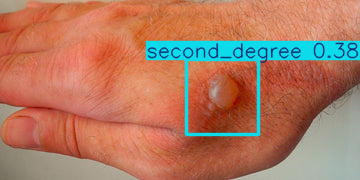

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1.], device='cuda:0')
conf: tensor([0.5479], device='cuda:0')
data: tensor([[167.4090,  44.9819, 228.3428,  92.3937,   0.5479,   1.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (180, 360)
shape: torch.Size([1, 6])
xywh: tensor([[197.8759,  68.6878,  60.9338,  47.4118]], device='cuda:0')
xywhn: tensor([[0.5497, 0.3816, 0.1693, 0.2634]], device='cuda:0')
xyxy: tensor([[167.4090,  44.9819, 228.3428,  92.3937]], device='cuda:0')
xyxyn: tensor([[0.4650, 0.2499, 0.6343, 0.5133]], device='cuda:0')
None


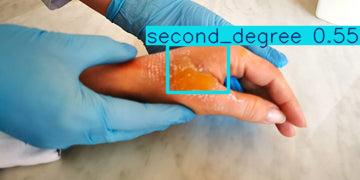

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1.], device='cuda:0')
conf: tensor([0.8325], device='cuda:0')
data: tensor([[ 36.8073,  37.9021, 251.7192, 142.8735,   0.8325,   1.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (180, 360)
shape: torch.Size([1, 6])
xywh: tensor([[144.2633,  90.3878, 214.9118, 104.9714]], device='cuda:0')
xywhn: tensor([[0.4007, 0.5022, 0.5970, 0.5832]], device='cuda:0')
xyxy: tensor([[ 36.8073,  37.9021, 251.7192, 142.8735]], device='cuda:0')
xyxyn: tensor([[0.1022, 0.2106, 0.6992, 0.7937]], device='cuda:0')
None


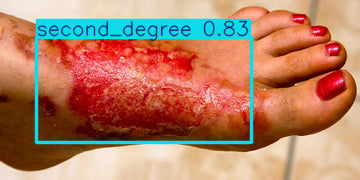

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1., 1.], device='cuda:0')
conf: tensor([0.7535, 0.7509], device='cuda:0')
data: tensor([[8.9373e+02, 3.7487e+02, 1.0373e+03, 7.1196e+02, 7.5354e-01, 1.0000e+00],
        [4.9572e+02, 2.3485e+02, 8.5482e+02, 6.7266e+02, 7.5094e-01, 1.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (874, 1165)
shape: torch.Size([2, 6])
xywh: tensor([[965.5313, 543.4155, 143.5978, 337.0840],
        [675.2684, 453.7518, 359.0960, 437.8125]], device='cuda:0')
xywhn: tensor([[0.8288, 0.6218, 0.1233, 0.3857],
        [0.5796, 0.5192, 0.3082, 0.5009]], device='cuda:0')
xyxy: tensor([[ 893.7324,  374.8735, 1037.3302,  711.9575],
        [ 495.7204,  234.8456,  854.8165,  672.6580]], device='cuda:0')
xyxyn: tensor([[0.7672, 0.4289, 0.8904, 0.8146],
        [0.4255, 0.2687, 0.7337, 0.7696]], device='cuda:0')
None


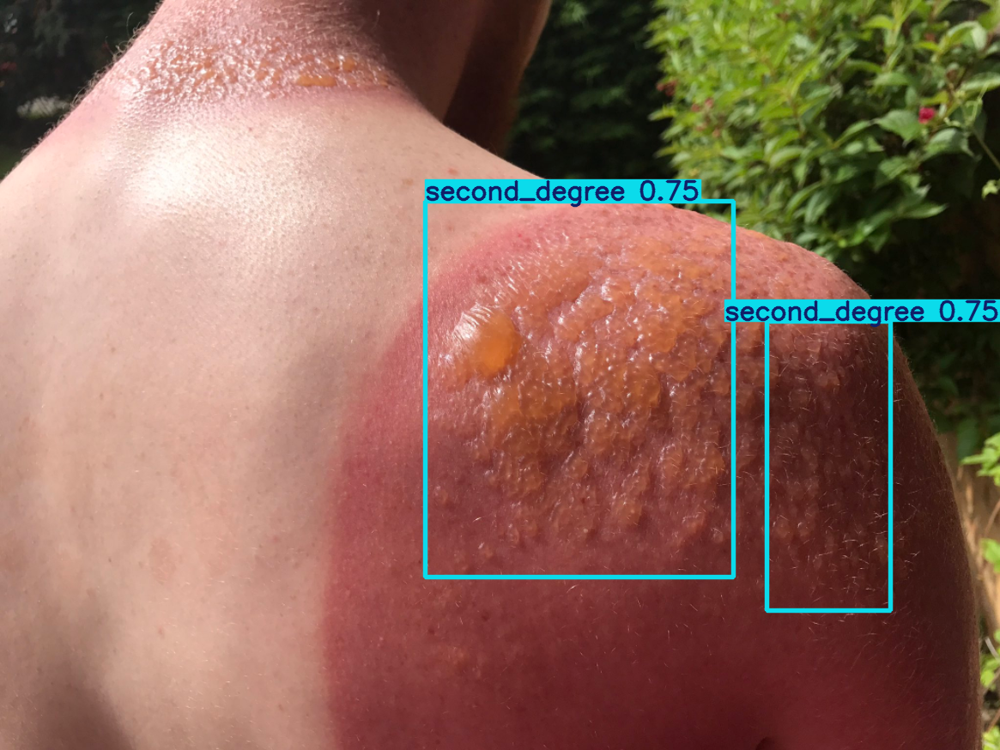

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1., 1.], device='cuda:0')
conf: tensor([0.6345, 0.3113], device='cuda:0')
data: tensor([[1.5771e+03, 1.4984e+03, 2.7425e+03, 2.4480e+03, 6.3452e-01, 1.0000e+00],
        [1.4195e+03, 1.0889e+03, 2.3217e+03, 1.9817e+03, 3.1132e-01, 1.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (2448, 3264)
shape: torch.Size([2, 6])
xywh: tensor([[2159.8406, 1973.2096, 1165.4028,  949.5808],
        [1870.6058, 1535.3286,  902.1248,  892.8303]], device='cuda:0')
xywhn: tensor([[0.6617, 0.8060, 0.3570, 0.3879],
        [0.5731, 0.6272, 0.2764, 0.3647]], device='cuda:0')
xyxy: tensor([[1577.1392, 1498.4192, 2742.5420, 2448.0000],
        [1419.5435, 1088.9135, 2321.6682, 1981.7438]], device='cuda:0')
xyxyn: tensor([[0.4832, 0.6121, 0.8402, 1.0000],
        [0.4349, 0.4448, 0.7113, 0.8095]], device='cuda:0')
None


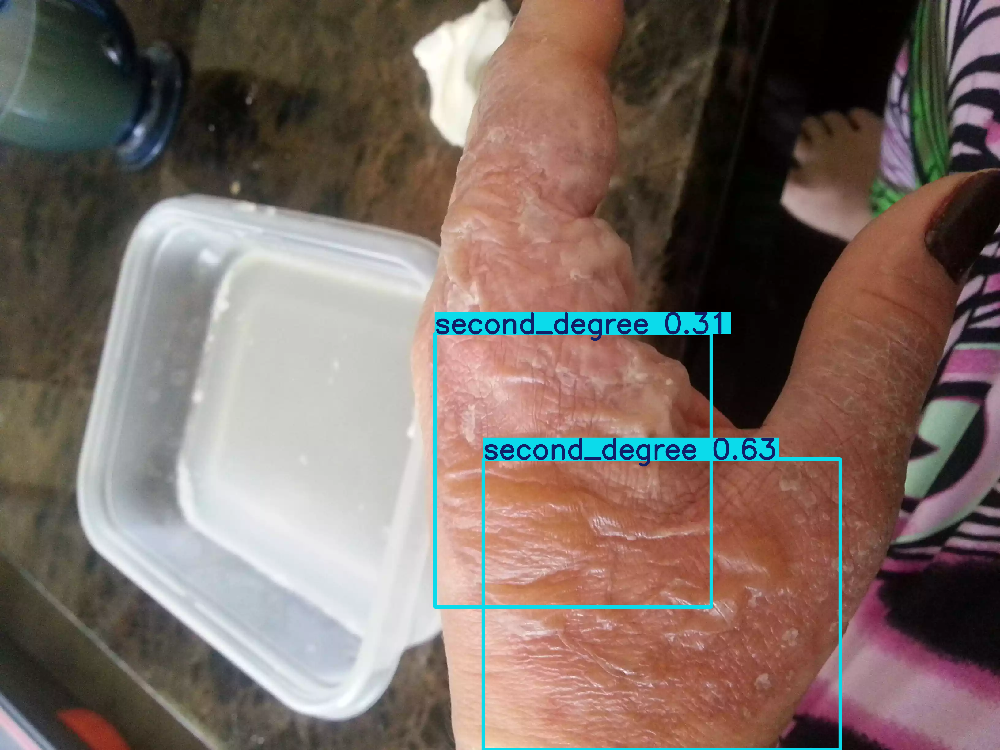

In [ ]:
#test our model on our test data
test_path = '/content/drive/MyDrive/Colab Notebooks/FirstAId/test_images'

results = model.predict(source=test_path, save=True)

for result in results:
  boxes = result.boxes
  probs = result.probs
  print(boxes)
  print(probs)
  result.show()
  result.save(filename='result.jpg')

# Save the model and it's weights

In [ ]:
import os
import locale

# Check the current locale
current_locale = locale.getpreferredencoding()
print(f"Current locale: {current_locale}")

# Set locale to UTF-8
if current_locale != "UTF-8":
    print("Setting locale to UTF-8")
    os.environ['LC_ALL'] = 'C.UTF-8'
    os.environ['LANG'] = 'C.UTF-8'
    try:
        # Attempt to set locale in Python
        locale.setlocale(locale.LC_ALL, 'C.UTF-8')
    except locale.Error as e:
        print(f"Warning: Could not set locale in Python: {e}")

    # Verify system-level locale
    os.system("export LC_ALL=C.UTF-8")
    os.system("export LANG=C.UTF-8")

    # Re-check locale
    new_locale = locale.getpreferredencoding()
    print(f"Current locale after setting: {new_locale}")
else:
    print("Locale is already UTF-8")


Current locale: ANSI_X3.4-1968
Setting locale to UTF-8
Current locale after setting: ANSI_X3.4-1968


In [ ]:
import shutil

source = "/content/runs/detect/train/weights/best.pt"
destination = "/content/drive/MyDrive/Colab Notebooks/FirstAId/skin_burn_detector.pt"

try:
    shutil.copy(source, destination)
    print("File copied successfully!")
except FileNotFoundError as e:
    print(f"Error: {e}")
except Exception as e:
    print(f"Unexpected error: {e}")

File copied successfully!


In [ ]:
import shutil

source1 = "/runs/train/exp/weights/best.pt"
destination1 = "/content/drive/MyDrive/Colab Notebooks/FirstAId/skin_burn_detector1.pt"

try:
    shutil.copy(source, destination)
    print("File copied successfully!")
except FileNotFoundError as e:
    print(f"Error: {e}")
except Exception as e:
    print(f"Unexpected error: {e}")

File copied successfully!


In [ ]:
#export the trained model for easier calling
model.export(format='onnx',
             save_dir='/content/drive/MyDrive/Colab Notebooks/FirstAId',
             name='skin_burn_detector.onnx')

Ultralytics 8.3.59 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.00GHz)

PyTorch: starting from 'runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 7, 8400) (38.6 MB)

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.47...
ONNX: export success ✅ 5.9s, saved as 'runs/detect/train/weights/best.onnx' (76.7 MB)

Export complete (7.9s)
Results saved to /content/runs/detect/train/weights
Predict:         yolo predict task=detect model=runs/detect/train/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=runs/detect/train/weights/best.onnx imgsz=640 data=/content/drive/MyDrive/Colab Notebooks/FirstAId/data.yaml  
Visualize:       https://netron.app


'runs/detect/train/weights/best.onnx'

In [ ]:
import shutil

# Define source and destination paths
source_folder = "/content/runs/detect/train/weights"
destination_folder = "/content/drive/MyDrive/Colab Notebooks/FirstAId/exported_model"


if os.path.exists(destination_folder):
    shutil.rmtree(destination_folder)

try:
    shutil.copytree(source_folder, destination_folder)
    print(f"Folder copied successfully from {source_folder} to {destination_folder}")
except FileNotFoundError as e:
    print(f"Error: {e}")
except Exception as e:
    print(f"Unexpected error: {e}")



Folder copied successfully from /content/runs/detect/train/weights to /content/drive/MyDrive/Colab Notebooks/FirstAId/exported_model
